# SB5 — Sensitivity to noise

In [1]:
# SB6: Show-only wie in SB5 (keine Dateien speichern)
# ------------------------------------------------------------------
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.figure as mfigure
from IPython.display import display
import importlib

# Importe, damit evtl. rcParams aus evaluator.py sichtbar sind
import evaluator, main  # keine Änderungen an diesen Modulen

# 1) "tight" & constrained_layout abschalten (wie SB5-Feeling)
mpl.rcParams["savefig.bbox"] = "standard"
mpl.rcParams["figure.constrained_layout.use"] = False

# 2) Speichern abfangen: savefig zeigt die Figur nur an (kein Write)
try:
    _ORIG_PLT_SAVEFIG
except NameError:
    _ORIG_PLT_SAVEFIG = plt.savefig

def _plt_savefig_show(*args, **kwargs):
    # Statt speichern einfach die aktuelle Figur anzeigen
    fig = plt.gcf()
    display(fig)  # zeigt inline
    # nichts speichern

plt.savefig = _plt_savefig_show

try:
    _ORIG_FIG_SAVEFIG
except NameError:
    _ORIG_FIG_SAVEFIG = mfigure.Figure.savefig

def _fig_savefig_show(self, *args, **kwargs):
    # Falls fig.savefig(...) verwendet wird: ebenfalls nur anzeigen
    display(self)  # zeigt die konkrete Figure
    # nichts speichern

mfigure.Figure.savefig = _fig_savefig_show

# 3) Optional: Main nicht zum Batch-Export nutzen (Plots kommen eh inline)
#    (Falls du run_and_collect -> main.main() nutzt, ist das egal, da savefig gepatcht ist.)
# main.PLOT_IN_MAIN = True  # Default ist True; kann so bleiben
# ------------------------------------------------------------------

print("SB6 ist jetzt im Show-only-Modus (keine PNGs, nur Inline-Anzeige).")


SB6 ist jetzt im Show-only-Modus (keine PNGs, nur Inline-Anzeige).


In [2]:
# import matplotlib.pyplot as plt, matplotlib.figure as mfigure
# plt.savefig = _ORIG_PLT_SAVEFIG
# mfigure.Figure.savefig = _ORIG_FIG_SAVEFIG
# print("savefig wiederhergestellt (Speichern aktiv).")


In [3]:

import os, sys, time, json, glob
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Image, Markdown, HTML

# import matplotlib as mpl
# mpl.rcParams["savefig.bbox"] = "standard"
# mpl.rcParams["figure.autolayout"] = False
# mpl.rcParams["figure.constrained_layout.use"] = False


# Ensure local modules are importable
ROOT = Path("/mnt/data").resolve()
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

import main  # uses /mnt/data/main.py
from evaluator import (
    load_logs, aggregate_regret, plot_regret_curves, add_normalized_regret,
    aggregate_regret_norm, plot_regret_norm_curves, plot_box_regret_at_T,
    plot_box_regret_norm_at_T, plot_box_best_value_at_T, plot_ybest_curves,
    rank_by_group, winrate_by_group, plot_rank_heatmap, plot_winrate_heatmap,
    save_rank_tables, save_tables, export_best_at_T_table,
    save_best_at_T_tables_as_png, render_boxplot_side_tables, export_auc_table_from_agg
)  # uses /mnt/data/evaluator.py

def find_latest_results(exp_name: str) -> Path:
    root = Path("results")
    if not root.exists():
        raise FileNotFoundError("No results/ folder yet.")
    cands = [p for p in root.glob(f"*_{exp_name}") if p.is_dir()]
    if not cands:
        # fallback: any folder containing exp_name
        cands = [p for p in root.glob("*_*") if exp_name in p.name]
    if not cands:
        raise FileNotFoundError(f"No results subfolder matching: {exp_name}")
    return max(cands, key=lambda p: p.stat().st_mtime)

def show_pngs(paths, width=820):
    for p in paths:
        p = Path(p)
        if p.exists():
            display(Image(filename=str(p), width=width))

def show_all_core_plots(outdir: Path):
    # Display the plots main.py already created when PLOT_IN_MAIN=True
    plots = outdir / "plots"
    # groups = [
    #     "regret_curves", "regret_curves_obs", "regret_norm_curves",
    #     "regret", "regret_obs", "regret_norm", "best_value", "heatmaps"
    # ]
    # groups = [
    #     "regret_curves", "regret_norm_curves",
    #     "regret", "regret_norm", "best_value", "heatmaps"
    # ]
    groups = [
        "regret_curves",
        "regret"
    ]
    all_imgs = []
    for g in groups:
        d = plots / g
        if d.exists():
            all_imgs += sorted(d.glob("*.png"))
    if all_imgs:
        print(f"Showing {len(all_imgs)} plot images ...")
        show_pngs(all_imgs)

    # # Also show the small per-boxplot side tables (PNG) if present
    # table_pngs = sorted((outdir/"plots").rglob("*_table.png"))
    # if table_pngs:
    #     print(f"Showing {len(table_pngs)} boxplot side-table PNGs ...")
    #     show_pngs(table_pngs, width=640)

    # # And global 'best_at_T' PNG tables
    # global_tables = sorted((outdir/"tables").glob("best_at_T_*.png"))
    # if global_tables:
    #     print("Global Best@T tables:")
    #     show_pngs(global_tables, width=720)

def show_core_dataframes(outdir: Path):
    # Load unified logs
    df = load_logs(outdir)
    print("all_runs.csv shape:", df.shape)
    # Final rows per run for boxplots
    keys = ["problem","method","seed","budget"]
    if "noise_pct" in df.columns:
        keys.append("noise_pct")
    dff = df.sort_values("iter").groupby(keys, as_index=False).tail(1)
    display(Markdown("**Final rows per run (for boxplots):**"))
    display(dff.head(20))

    # Aggregates for curves (true & observed regret)
    agg_true = aggregate_regret(df, use_observed=False)
    display(Markdown("**Aggregate (true regret) for curves:**"))
    display(agg_true.head(20))
    # agg_obs = aggregate_regret(df, use_observed=True)
    # display(Markdown("**Aggregate (observed regret) for curves:**"))
    # display(agg_obs.head(20))

    # Normalized regret
    dfn = add_normalized_regret(df.copy())
    if "regret_norm" in dfn.columns:
        aggn = aggregate_regret_norm(dfn)
        display(Markdown("**Aggregate (normalized regret) for curves:**"))
        display(aggn.head(20))

# ---- safe PNG render to avoid gigantic bbox issues in notebooks ----
import io, matplotlib.pyplot as plt
from IPython.display import Image as _IPyImage, display as _ipy_display

def _safe_show(fig, dpi=150):
    buf = io.BytesIO()
    fig.savefig(buf, format="png", dpi=dpi, bbox_inches="standard")  # << wichtig: standard!
    buf.seek(0)
    _ipy_display(_IPyImage(data=buf.read()))
    plt.close(fig)


In [9]:
# --- CONFIG --------------------------------------------------------------
main.EXP_NAME      = 'SB6_Budget_sensitivity'
main.PROBLEMS      = ['Branin', 'Rosenbrock']
main.METHODS       = ['DOE_LHS', 'BO_EI', 'Random']

main.BUDGETS       = [10, 20, 50, 100]
main.SEEDS         = list(range(40))
main.NOISE_PCTS    = [0.2]
main.INIT_FACTOR   = 2.0
main.PLOT_IN_MAIN  = True
main.GENERATE_SAMPLES   = False
main.FINAL_SAMPLES_AT_T = True
main.K_EVERY            = 4
print("✓ CONFIG applied here (overrides main.py defaults during this run).")


✓ CONFIG applied here (overrides main.py defaults during this run).


In [5]:
def run_and_collect(exp_name: str):
    # main.main() uses current module-level config values set above.
    print("Launching main.main() ...")
    main.main()
    outdir = find_latest_results(exp_name)

    # Recompute aggregates and export AUC tables
    from evaluator import aggregate_regret, aggregate_regret_norm, add_normalized_regret, export_auc_table_from_agg
    df_all = load_logs(outdir)

    agg_true = aggregate_regret(df_all, use_observed=False)
    export_auc_table_from_agg(agg_true, outdir, label="true")

    # agg_obs = aggregate_regret(df_all, use_observed=True)
    # export_auc_table_from_agg(agg_obs, outdir, label="obs")

    dfn = add_normalized_regret(df_all.copy())
    if "regret_norm" in dfn.columns:
        aggn = aggregate_regret_norm(dfn)
        export_auc_table_from_agg(aggn, outdir, label="norm")

    print("Artifacts written to:", outdir)
    # Ensure all table PNGs exist (best@T + per-boxplot)
    try:
        save_best_at_T_tables_as_png(outdir, decimals=3)
    except Exception as e:
        print("[warn] save_best_at_T_tables_as_png:", e)
    try:
        render_boxplot_side_tables(outdir, decimals=3)
    except Exception as e:
        print("[warn] render_boxplot_side_tables:", e)
    return outdir


In [6]:
# --- HOTFIX 1: Entschärfe savefig, wenn bbox_inches="tight" kommt (ohne deinen Code zu ändern)
import matplotlib.pyplot as plt
from functools import wraps

_ORIG_SAVEFIG = plt.savefig

@wraps(_ORIG_SAVEFIG)
def _savefig_no_tight(*args, **kwargs):
    # Verhindert riesige Bounding Boxes durch "tight"
    if kwargs.get("bbox_inches") == "tight":
        kwargs["bbox_inches"] = None
    # Optional: DPI deckeln (beugt sehr großen PNGs vor)
    if "dpi" in kwargs and kwargs["dpi"] and kwargs["dpi"] > 120:
        kwargs["dpi"] = 120
    return _ORIG_SAVEFIG(*args, **kwargs)

plt.savefig = _savefig_no_tight
print("✓ Hotfix aktiv: savefig tight→standard, dpi≤120")


✓ Hotfix aktiv: savefig tight→standard, dpi≤120


In [7]:
# # --- HOTFIX 2 (optional): Median-Label-Annotator temporär ausknipsen
# import evaluator as ev
# if hasattr(ev, "_annotate_median_labels_next_to_lines"):
#     ev._annotate_median_labels_next_to_lines = lambda *a, **k: None
#     print("✓ Hotfix aktiv: Median-Labels in Main-Boxplots deaktiviert")


Launching main.main() ...
[run] Branin | DOE_LHS | seed=0 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=1 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=2 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=3 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=4 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=5 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=6 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=7 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=8 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=9 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=10 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=11 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=12 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=13 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=14 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=15 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=16 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=17 | T=10 | noise=0.20
[run] Branin | DOE_LHS | seed=

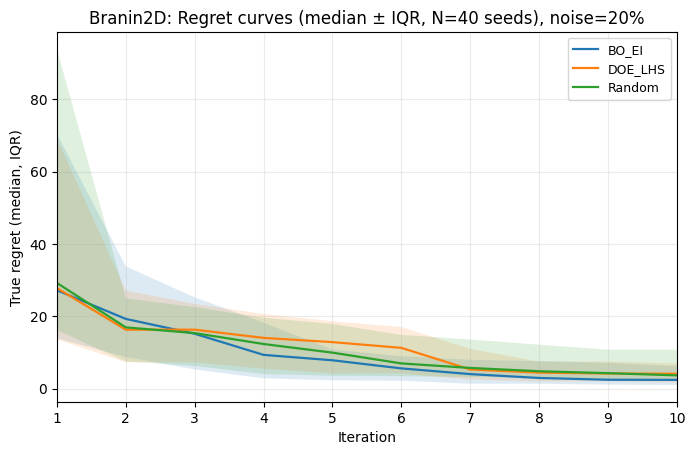

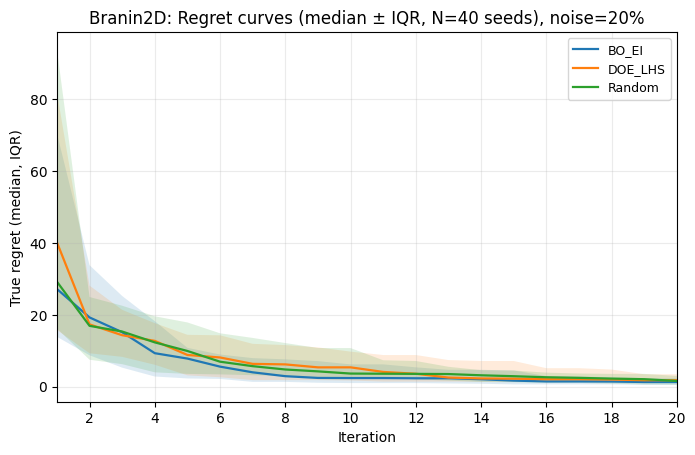

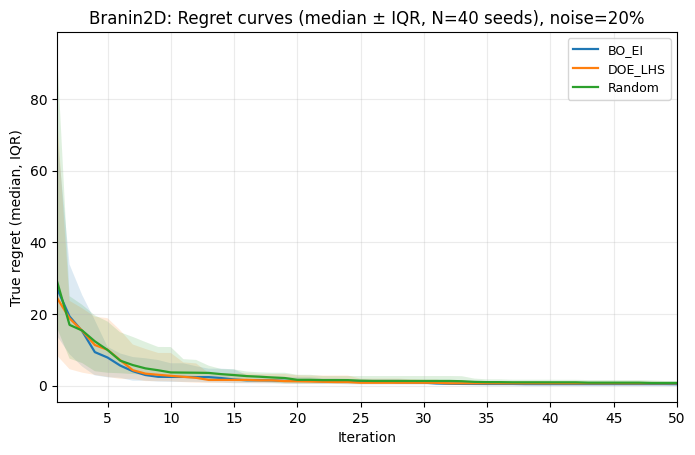

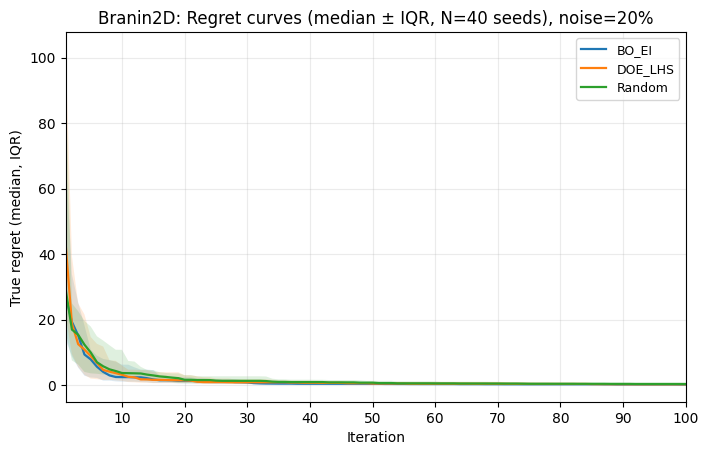

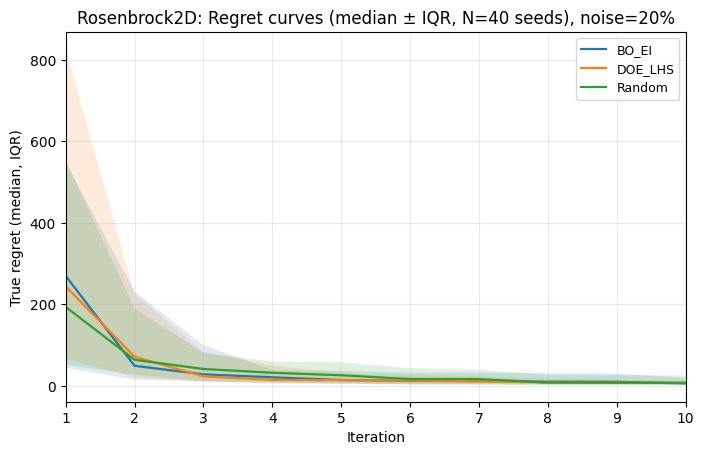

...

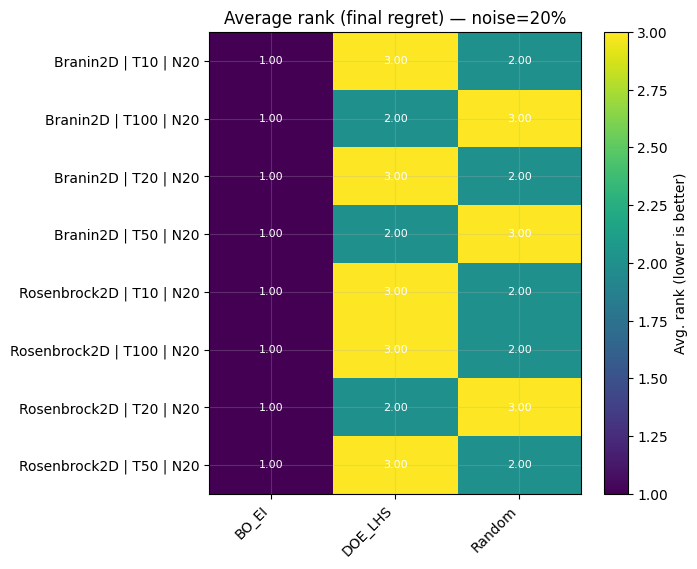

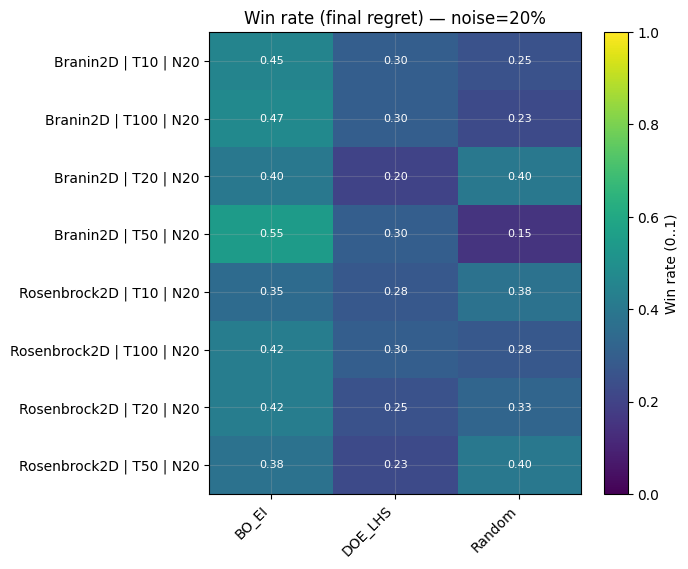

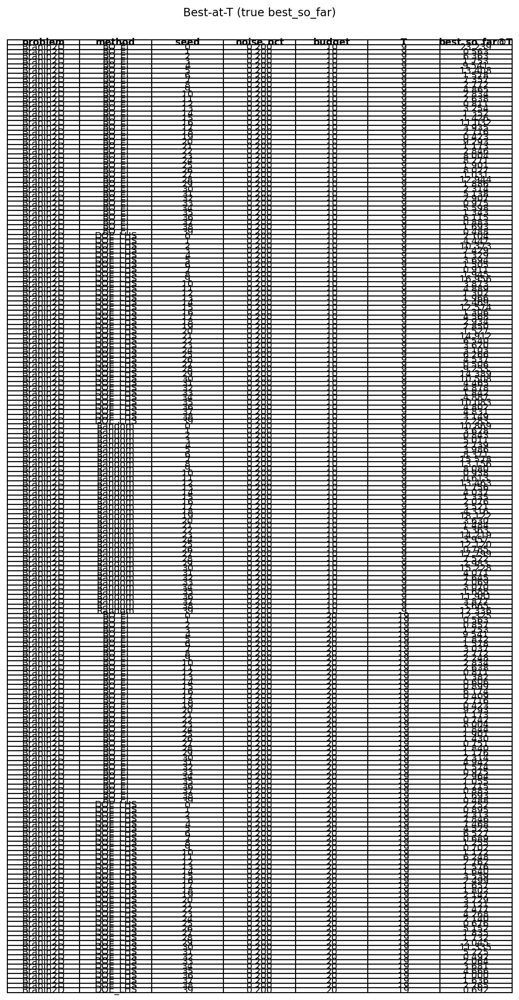

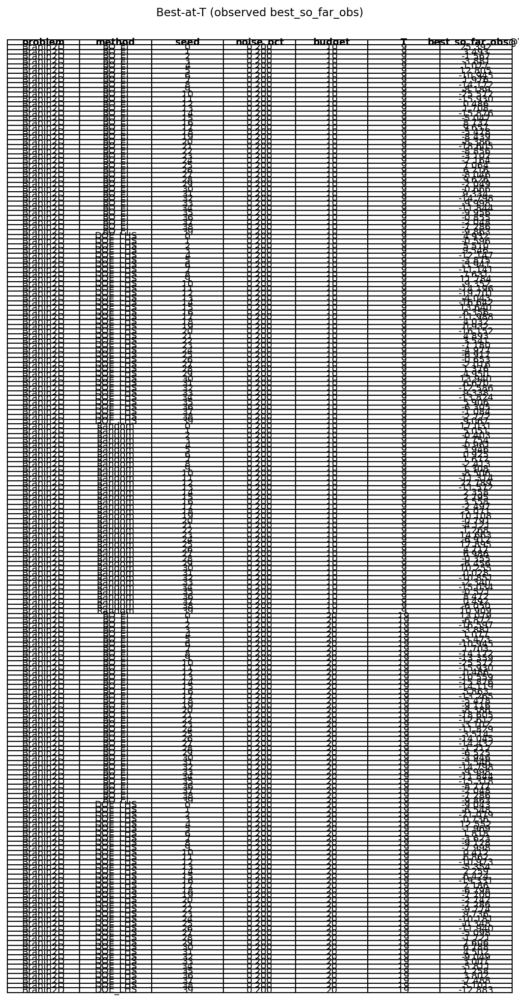

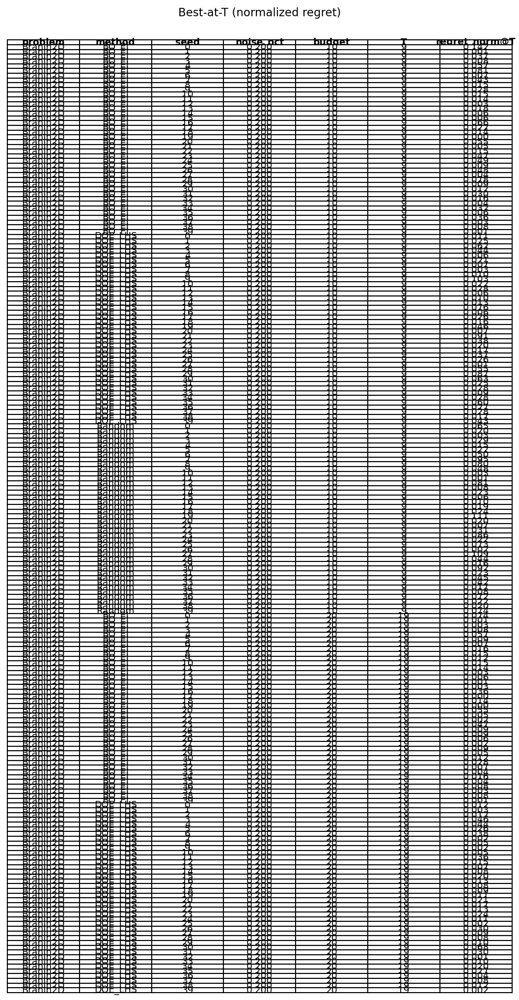

Table PNGs: {'true': 'results\\20251101_231453_SB6_Budget_sensitivity\\tables\\best_at_T_by_seed_method_true.png', 'obs': 'results\\20251101_231453_SB6_Budget_sensitivity\\tables\\best_at_T_by_seed_method_obs.png', 'norm': 'results\\20251101_231453_SB6_Budget_sensitivity\\tables\\best_at_T_by_seed_method_norm.png'}
[tables] generated 0 per-plot tables.
Report: results\20251101_231453_SB6_Budget_sensitivity\benchmark_report.html
[debug] all_runs shape: (43200, 21), columns: ['best_so_far', 'best_so_far_obs', 'budget', 'dim', 'exp_name', 'init_factor', 'iter', 'method', 'noise_pct', 'noise_seed', 'problem', 'regret', 'regret_obs', 'seed', 'sigma_noise', 'time_s', 'x', 'x_uv', 'x_xy', 'y', 'y_noisy']
Artifacts written to: results\20251101_231453_SB6_Budget_sensitivity


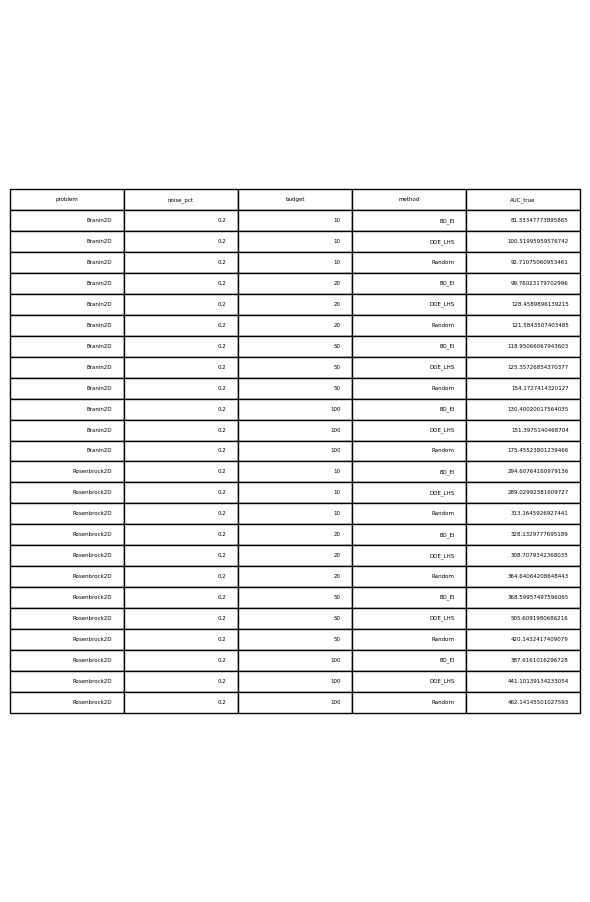

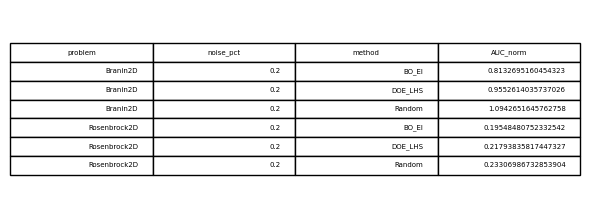

Artifacts written to: results\20251101_231453_SB6_Budget_sensitivity


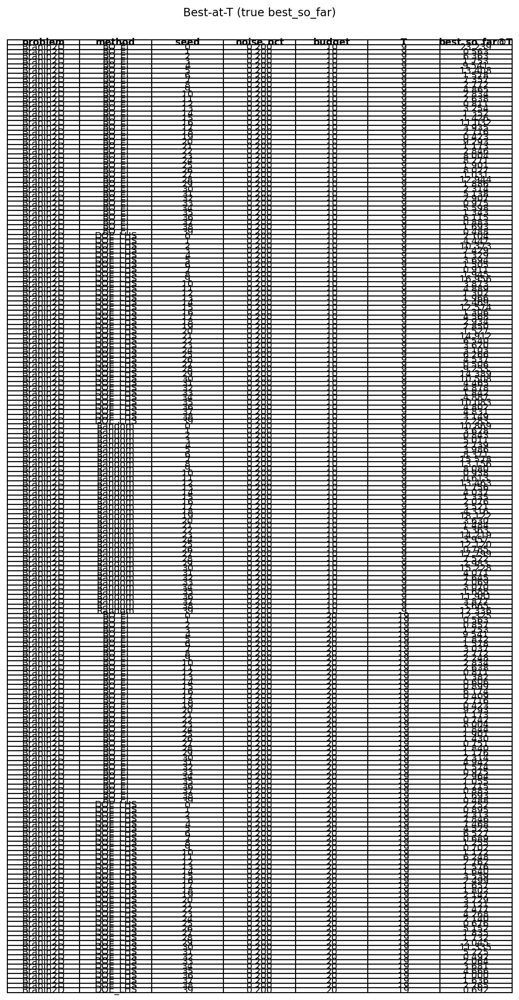

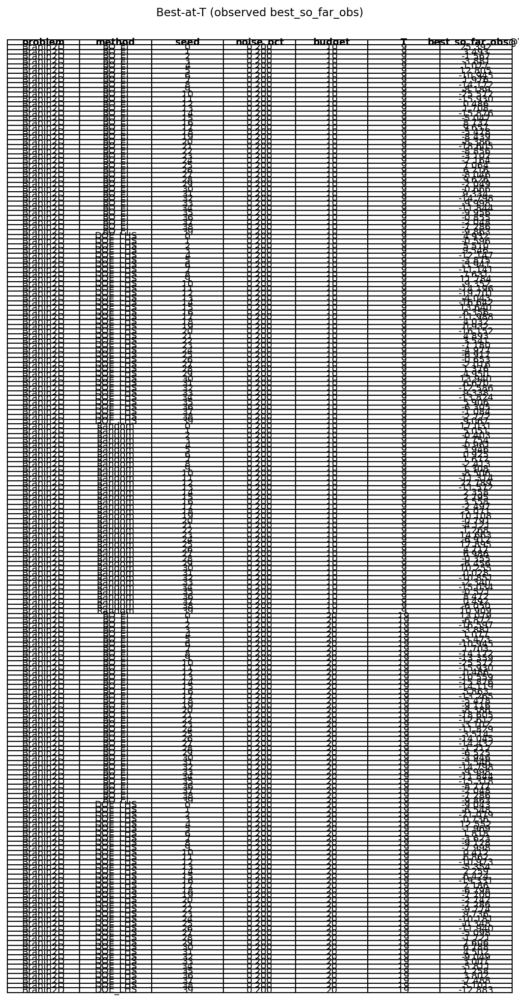

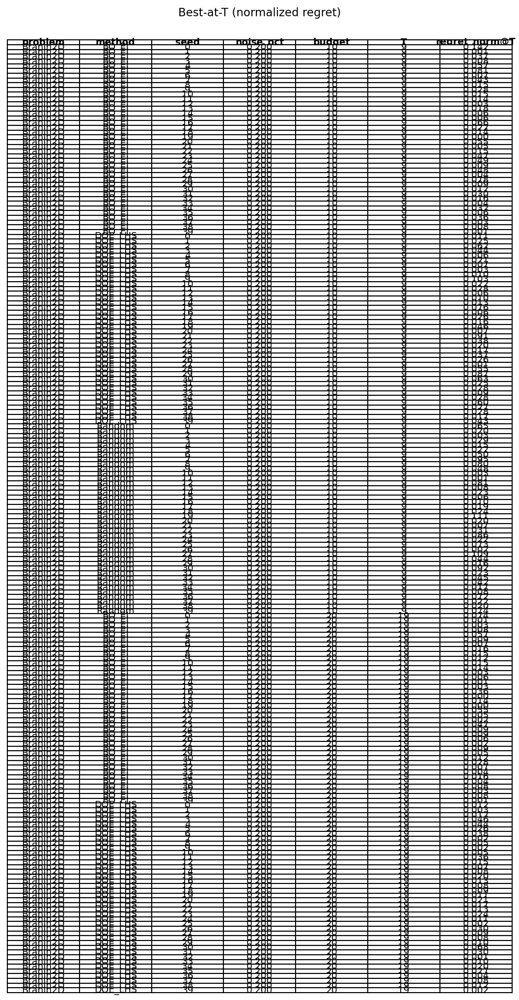

[tables] generated 0 per-plot tables.


In [10]:
outdir = run_and_collect(main.EXP_NAME)

In [11]:
show_all_core_plots(outdir)

In [12]:
show_core_dataframes(outdir)

all_runs.csv shape: (43200, 21)


**Final rows per run (for boxplots):**

,exp_name,problem,method,dim,seed,noise_seed,noise_pct,sigma_noise,budget,iter,...,x_uv,x_xy,x,y,y_noisy,best_so_far,best_so_far_obs,regret,regret_obs,time_s
26029,SB6_Budget_sensitivity,Rosenbrock2D,BO_EI,2,31,777031,0.2,133.482153,10,9,...,"[0.520481900011541, 0.9992233072472372]","[0.08389386244727204, 2.0448186664846837]","[0.08389386244727204, 2.0448186664846837]",416.094182,308.631908,2.004124,46.487079,2.004124,46.487079,0.498730
1369,SB6_Budget_sensitivity,Branin2D,BO_EI,2,16,777016,0.2,10.305344,10,9,...,"[0.5875044462302372, 0.7654959773579844]","[3.812566693453558, 11.482439660369765]","[3.812566693453558, 11.482439660369765]",96.037600,95.958346,11.032069,8.736955,10.634182,8.339068,0.170355
12529,SB6_Budget_sensitivity,Branin2D,DOE_LHS,2,36,777036,0.2,10.514817,10,9,...,"[0.8198342121739319, 0.2511080915213595]","[7.297513182608979, 3.766621372820392]","[7.297513182608979, 3.766621372820392]",21.328856,35.254473,4.801692,-6.304986,4.403805,-6.702873,0.000000
33949,SB6_Budget_sensitivity,Rosenbrock2D,DOE_LHS,2,35,777035,0.2,131.442988,10,9,...,"[0.19350068508498128, 0.1946825695746892]","[-1.2554211938919169, -1.250580195022073]","[-1.2554211938919169, -1.250580195022073]",804.089053,888.002888,13.870833,-57.692105,13.870833,-57.692105,0.000000
36469,SB6_Budget_sensitivity,Rosenbrock2D,Random,2,11,777011,0.2,136.629162,10,9,...,"[0.8167364359696581, 0.5490752688700263]","[1.2973524417317193, 0.20101230129162806]","[1.2973524417317193, 0.20101230129162806]",219.753737,166.333964,8.183263,-228.779449,8.183263,-228.779449,0.000000
24589,SB6_Budget_sensitivity,Rosenbrock2D,BO_EI,2,24,777024,0.2,131.203223,10,9,...,"[0.40390895391600157, 0.5895228952178359]","[-0.3935889247600577, 0.3666857788122555]","[-0.3935889247600577, 0.3666857788122555]",6.426893,-124.875442,0.974848,-168.848286,0.974848,-168.848286,0.300472
15589,SB6_Budget_sensitivity,Branin2D,Random,2,15,777015,0.2,10.353459,10,9,...,"[0.5343942272533609, 0.9446902786527566]","[3.0159134088004134, 14.170354179791348]","[3.0159134088004134, 14.170354179791348]",139.602760,135.865342,1.335197,2.794723,0.937310,2.396836,0.000000
5329,SB6_Budget_sensitivity,Branin2D,BO_EI,2,36,777036,0.2,10.514817,10,9,...,"[0.9598708659308642, 0.0029061230483474754]","[9.398062988962964, 0.04359184572521213]","[9.398062988962964, 0.04359184572521213]",6.204429,20.130046,6.114967,-0.855041,5.717080,-1.252928,0.313535
19369,SB6_Budget_sensitivity,Branin2D,Random,2,34,777034,0.2,10.121285,10,9,...,"[0.3876537188810498, 0.9252287549277367]","[0.8148057832157471, 13.87843132391605]","[0.8148057832157471, 13.87843132391605]",99.205577,81.516665,3.070032,-15.033669,2.672145,-15.431556,0.000000
2449,SB6_Budget_sensitivity,Branin2D,BO_EI,2,21,777021,0.2,10.104244,10,9,...,"[0.11147255126930955, 0.984169146996091]","[-3.3279117309603565, 14.762537204941365]","[-3.3279117309603565, 14.762537204941365]",4.706451,-4.483294,1.173153,-18.605116,0.775266,-19.003003,0.227042


**Aggregate (true regret) for curves:**

,problem,method,budget,noise_pct,iter,median,q25,q75,n
0,Branin2D,BO_EI,10,0.2,0,27.192097,13.890921,70.506640,40.0
1,Branin2D,BO_EI,10,0.2,1,19.269922,8.738699,33.806408,40.0
2,Branin2D,BO_EI,10,0.2,2,15.160100,5.298059,25.242206,40.0
3,Branin2D,BO_EI,10,0.2,3,9.323280,2.834947,18.232169,40.0
4,Branin2D,BO_EI,10,0.2,4,7.825788,2.298759,10.814524,40.0
5,Branin2D,BO_EI,10,0.2,5,5.582778,2.158903,8.956784,40.0
6,Branin2D,BO_EI,10,0.2,6,4.001953,1.339856,7.956487,40.0
7,Branin2D,BO_EI,10,0.2,7,2.928967,1.339856,7.612055,40.0
8,Branin2D,BO_EI,10,0.2,8,2.442008,1.097130,7.121020,40.0
9,Branin2D,BO_EI,10,0.2,9,2.405266,1.009223,6.213712,40.0


**Aggregate (normalized regret) for curves:**

,problem,method,iter,median,q25,q75,noise_pct
0,Branin2D,BO_EI,0,0.169589,0.086634,0.439730,0.2
1,Branin2D,BO_EI,1,0.120181,0.054501,0.210841,0.2
2,Branin2D,BO_EI,2,0.094549,0.033043,0.157429,0.2
3,Branin2D,BO_EI,3,0.058147,0.017681,0.113709,0.2
4,Branin2D,BO_EI,4,0.048807,0.014337,0.067447,0.2
5,Branin2D,BO_EI,5,0.034818,0.013464,0.055861,0.2
6,Branin2D,BO_EI,6,0.024959,0.008356,0.049622,0.2
7,Branin2D,BO_EI,7,0.018267,0.008356,0.047474,0.2
8,Branin2D,BO_EI,8,0.015230,0.006842,0.044412,0.2
9,Branin2D,BO_EI,9,0.015001,0.006294,0.038753,0.2


Plotting methods: ['DOE_LHS', 'BO_EI', 'Random']


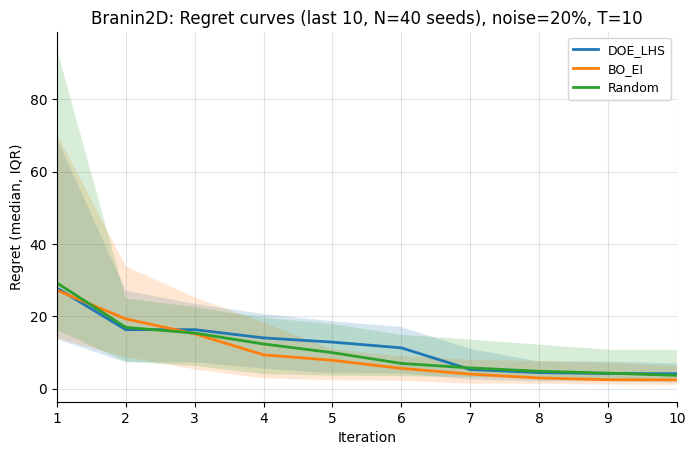

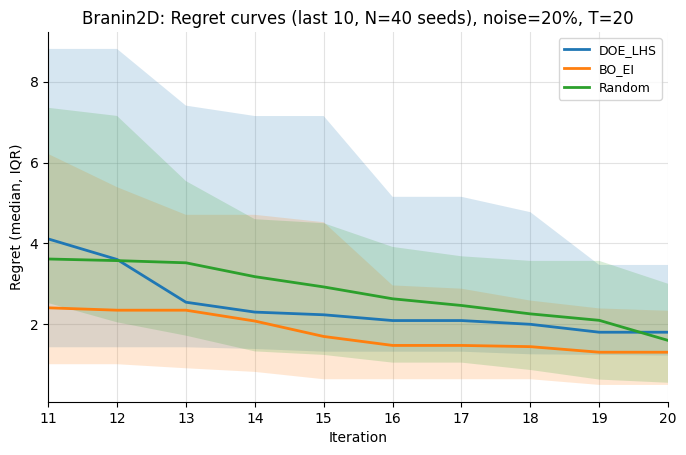

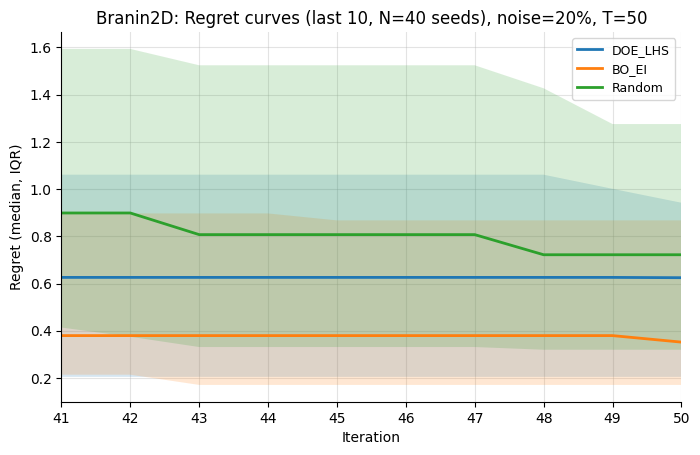

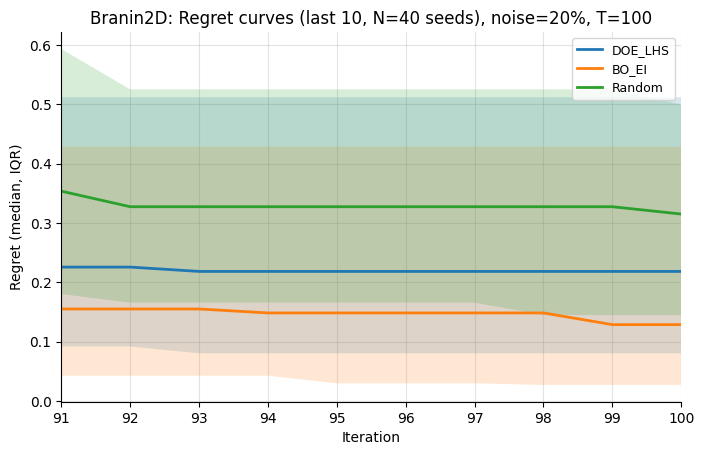

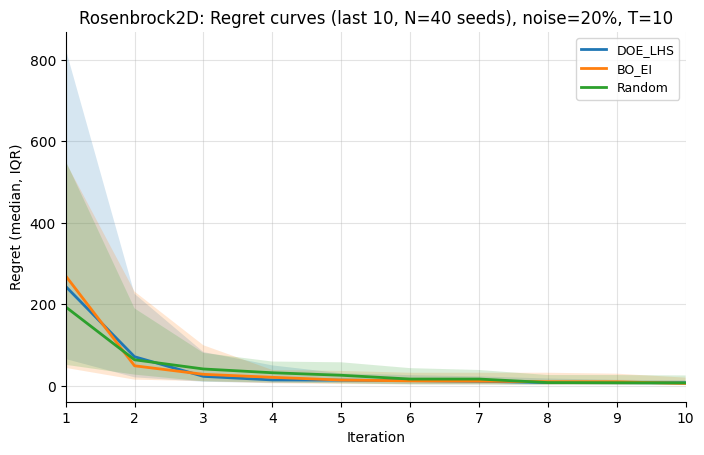

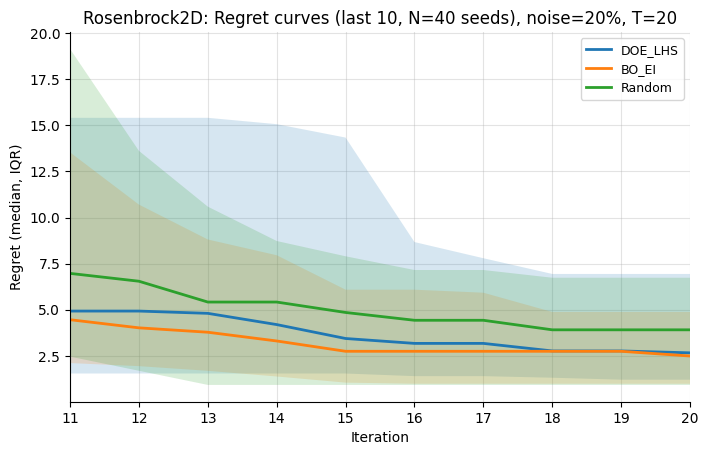

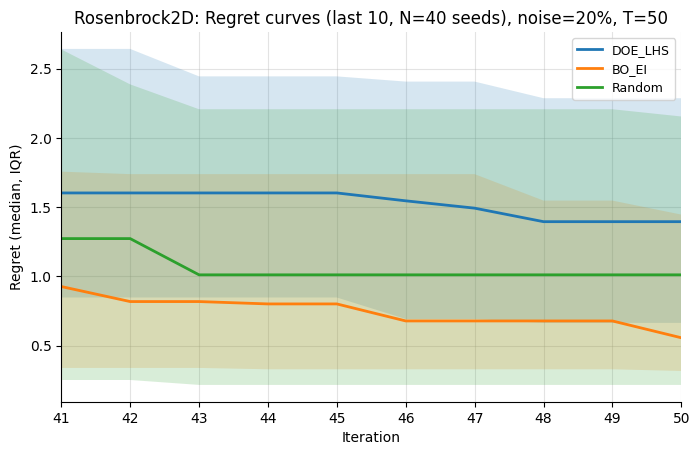

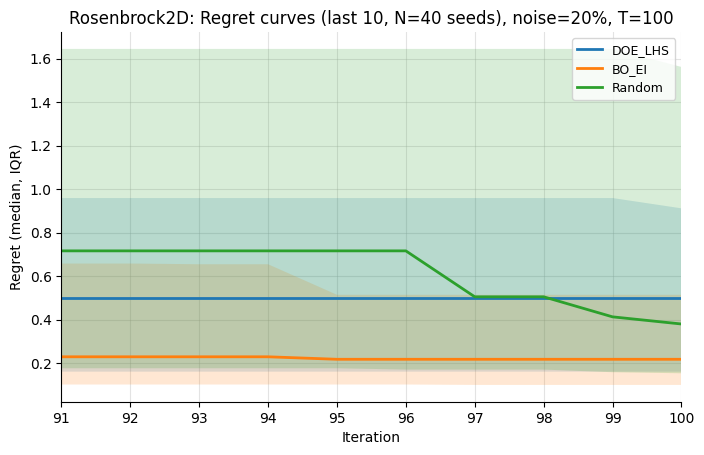

In [13]:
# ----------------------------------- LAST-10 REGRET CURVES (display only) --------------------------------------
import numpy as np, pandas as pd, matplotlib.pyplot as plt

# Daten laden
df_all = load_logs(outdir)
dfn    = add_normalized_regret(df_all.copy())

# volle Aggregate (für T-Bestimmung und Slicing)
agg_true_full = aggregate_regret(df_all, use_observed=False)   # cols: problem, method, [budget], noise_pct, iter, median, q25, q75, n
aggn_full     = aggregate_regret_norm(dfn)                     # cols: problem, method, [budget], noise_pct, iter, median, q25, q75, n

# --- Methoden dynamisch bestimmen (optional Reihenfolge aus main.METHODS respektieren) ---
try:
    import main
    pref_order = list(getattr(main, "METHODS", []))
except Exception:
    pref_order = []

all_methods = sorted(pd.unique(pd.concat([agg_true_full["method"], aggn_full["method"]], ignore_index=True)))
if pref_order:
    order_idx = {m: i for i, m in enumerate(pref_order)}
    methods = sorted(all_methods, key=lambda m: order_idx.get(m, len(pref_order)))
else:
    methods = all_methods

print("Plotting methods:", methods)

def _last_k_by_method(agg: pd.DataFrame, k: int) -> pd.DataFrame:
    """Nimmt je (problem, budget?, noise, method) die letzten k Iterationen (nach iter sortiert)."""
    cols = agg.columns.tolist()
    has_budget = "budget" in agg.columns
    pieces = []
    for p in sorted(agg["problem"].unique()):
        ap = agg[agg["problem"] == p]
        budgets = sorted(ap["budget"].unique()) if has_budget else [None]
        for b in budgets:
            ab = ap if b is None else ap[ap["budget"] == b]
            for n in sorted(ab["noise_pct"].unique()):
                sub = ab[ab["noise_pct"] == n]
                if sub.empty:
                    continue
                present = [m for m in methods if m in set(sub["method"])]
                for m in present:
                    sm = sub[sub["method"] == m].sort_values("iter")
                    iters = sorted(sm["iter"].unique())
                    take = iters[-min(k, len(iters)):]
                    pieces.append(sm[sm["iter"].isin(take)])
    return pd.concat(pieces, ignore_index=True)[cols] if pieces else agg.iloc[0:0]

agg_true_l10 = _last_k_by_method(agg_true_full, k=10)
aggn_l10     = _last_k_by_method(aggn_full,     k=10)

def _Tinfo_from_full(agg_full: pd.DataFrame):
    """Ermittelt T_end und x-Offset je (problem, noise[, budget])."""
    info = {}
    has_budget = "budget" in agg_full.columns
    for p in agg_full["problem"].unique():
        ap = agg_full[agg_full["problem"] == p]
        budgets = sorted(ap["budget"].unique()) if has_budget else [None]
        for b in budgets:
            ab = ap if b is None else ap[ap["budget"] == b]
            for n in sorted(ab["noise_pct"].unique()):
                sub = ab[ab["noise_pct"] == n]
                if sub.empty:
                    continue
                it_min = int(sub["iter"].min())
                it_max = int(sub["iter"].max())
                x_off  = 1 if it_min == 0 else 0   # 0-based iter → +1
                T_end  = it_max + x_off            # z.B. 49+1 = 50
                info[(p, n, b)] = (T_end, x_off)
    return info

Tinfo_true = _Tinfo_from_full(agg_true_full)
Tinfo_norm = _Tinfo_from_full(aggn_full)

def _plot_windowed_curves(slice_lastk: pd.DataFrame, Tinfo_full: dict,
                          title_prefix: str, ylabel: str, k:int=10):
    """Zeigt die letzten k Punkte, x-Achse endet exakt bei T=max und beginnt bei T-k+1."""
    if slice_lastk.empty:
        print("[warn] No data to plot.")
        return
    has_budget = "budget" in slice_lastk.columns
    for p in sorted(slice_lastk["problem"].unique()):
        ap = slice_lastk[slice_lastk["problem"] == p]
        budgets = sorted(ap["budget"].unique()) if has_budget else [None]
        for b in budgets:
            ab = ap if b is None else ap[ap["budget"] == b]
            for n in sorted(ab["noise_pct"].unique()):
                key = (p, n, b)
                if key not in Tinfo_full:
                    continue
                T_end, x_off = Tinfo_full[key]
                xmin, xmax = max(1, T_end - (k - 1)), T_end

                sub = ab[ab["noise_pct"] == n]
                if sub.empty:
                    continue
                # Methoden für dieses Subset dynamisch (in gewünschter Reihenfolge)
                present = [m for m in methods if m in set(sub["method"])]

                fig, ax = plt.subplots(figsize=(8, 4.8))
                for m in present:
                    sm = sub[sub["method"] == m].sort_values("iter")
                    x  = sm["iter"].to_numpy(dtype=float) + x_off
                    y  = sm["median"].to_numpy(dtype=float)
                    q1 = sm["q25"].to_numpy(dtype=float)
                    q3 = sm["q75"].to_numpy(dtype=float)
                    ax.plot(x, y, label=m, linewidth=2.0)
                    ax.fill_between(x, q1, q3, alpha=0.18)

                seeds_txt = ""
                if "n" in sub.columns and sub["n"].notna().any():
                    try: seeds_txt = f", N={int(sub['n'].max())} seeds"
                    except: pass

                title = f"{p}: {title_prefix} (last {k}{seeds_txt}), noise={int(round(100*float(n)))}%"
                if b is not None:
                    title += f", T={int(b)}"

                ax.set_title(title)
                ax.set_xlabel("Iteration")
                ax.set_ylabel(ylabel)
                ax.set_xlim(xmin, xmax)                         # endet garantiert bei T=max
                xt = list(range(xmin, xmax+1))
                if len(xt) > 10:
                    step = int(np.ceil(len(xt)/10))
                    xt = list(range(xmin, xmax+1, step))
                    if xt[-1] != xmax:
                        xt.append(xmax)
                ax.set_xticks(xt)
                ax.grid(True, alpha=0.35); ax.set_axisbelow(True)
                for s in ("top","right"): ax.spines[s].set_visible(False)
                ax.legend(loc="upper right")
                plt.show()

# Anzeigen (nur display)
_plot_windowed_curves(agg_true_l10, Tinfo_true, title_prefix="Regret curves",            ylabel="Regret (median, IQR)", k=10)
# _plot_windowed_curves(aggn_l10,     Tinfo_norm, title_prefix="Normalized regret curves", ylabel="Normalized regret (median, IQR)", k=10)


In [43]:
# --------------------- INLINE BOXPLOT: BO/DOE/Random je Budget (Final regret @T) ---------------------
from pathlib import Path
from typing import Optional, Sequence
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from matplotlib import transforms as mtransforms
from IPython.display import Markdown, display
import evaluator as ev

# optionaler Style
try:
    import tb_style
    tb_style.apply()
except Exception:
    pass

def _value_col_from_metric(metric: str) -> str:
    m = metric.lower()
    if m in ("regret","true"): return "regret"
    if m in ("regret_norm","norm"): return "regret_norm"
    if m in ("best_so_far","best"): return "best_so_far"
    raise ValueError("metric must be one of {'regret','regret_norm','best_so_far'}")

def _ylabel_from_metric(metric: str) -> str:
    m = metric.lower()
    if m == "regret": return "Final regret @ T"
    if m == "regret_norm": return "Final normalized regret @ T"
    if m == "best_so_far": return "Final best value @ T"
    return metric

def plot_box_methods_by_budget_inline(
    outdir: Path,
    problem: str = "Branin2D",
    methods: Optional[Sequence[str]] = ("BO_EI","DOE_LHS","Random"),
    display_name_map: Optional[dict] = None,  # {"BO_EI":"BO","DOE_LHS":"DOE","Random":"Random"}
    metric: str = "regret",
    budgets: Optional[Sequence[int]] = (10,20,50,100),
    noise_filter: Optional[float] = 0.20,     # SB6 default
    show_all_seeds: bool = True,
    highlight_seed: Optional[int] = None,
    # --- NEU: Stellschrauben für Layout ---
    jitter: float = 0.12,
    box_width: float = 0.20,      # Breite der Boxen
    method_sep: float = 0.26,     # Abstand der Boxen innerhalb einer Gruppe
    cluster_sep: float = 1.05,    # Abstand zwischen Gruppen (Budgets)
    # --------------------------------------
    bottom_pad: float = 0.30,
    ypad: float = 0.05,
    y_min_override: Optional[float] = None,
    y_max_override: Optional[float] = None,
    decimals: int = 3,
    median_display: str = "table",   # 'table' | 'none'
    method_y: float = -0.06,
    cluster_y: float = -0.12,
    # --- NEU: Median-Text-Optik ---
    median_text_color: str = "#ff7f0e",  # Matplotlib-Orange
    median_fontsize: int = 9,
):
    # --- Helper ---
    col = _value_col_from_metric(metric)
    ylabel = _ylabel_from_metric(metric)

    # Logs laden & Finalzeilen je Run
    df = ev.load_logs(outdir)
    try:
        base = ev._final_rows_per_run(df)
    except Exception:
        keys = ["problem","method","seed","budget"]
        if "noise_pct" in df.columns: keys.append("noise_pct")
        base = df.sort_values("iter").groupby(keys, as_index=False).tail(1)
    if base.empty:
        raise ValueError("No data after final-row filtering.")

    if "noise_pct" not in base.columns:
        base = base.copy(); base["noise_pct"] = 0.0
    if "budget" not in base.columns:
        g = df.sort_values("iter").groupby(["problem","method","seed"], as_index=False)["iter"].max()
        base = base.merge(g, on=["problem","method","seed"], suffixes=("","_as_budget"))
        base["budget"] = base["iter_as_budget"].astype(int)

    sub = base[base["problem"] == problem].copy()
    if sub.empty:
        raise ValueError(f"No rows for problem={problem}")

    if noise_filter is not None:
        sub = sub[np.isfinite(sub["noise_pct"])]
        sub = sub[np.isclose(sub["noise_pct"].astype(float), float(noise_filter))]
        if sub.empty:
            raise ValueError(f"No rows for problem={problem} at noise={noise_filter}")

    methods = list(methods) if methods is not None else sorted(sub["method"].unique().tolist())
    sub = sub[sub["method"].isin(methods)].copy()
    if display_name_map is None:
        display_name_map = {"BO_EI":"BO_EI","DOE_LHS":"DOE_LHS","Random":"Random"}
    disp = lambda m: display_name_map.get(m, m)

    all_T = sorted(pd.to_numeric(sub["budget"], errors="coerce").dropna().unique())
    budgets_use = [int(T) for T in (all_T if budgets is None else budgets) if int(T) in set(all_T)]
    if not budgets_use:
        raise ValueError(f"No requested budgets found in data. Present: {all_T}")

    # Y-Limits vorbereiten
    data_all = []
    for T in budgets_use:
        for m in methods:
            vals = sub[(sub["method"] == m) & (sub["budget"] == T)][col].to_numpy()
            if vals.size: data_all.append(vals)
    y_min = 0.0 if col in ("regret","regret_norm") else (
        float(np.nanmin([np.nanmin(d) for d in data_all])) if data_all else 0.0
    )
    ymax = (np.nanmax([np.nanmax(d) for d in data_all]) if data_all else 1.0)
    y_max = (1.0 if not np.isfinite(ymax) else ymax) * (1.0 + ypad)

    # Plot
    fig, ax = plt.subplots(figsize=(16, 6.5))
    centers = (np.arange(len(budgets_use), dtype=float) * cluster_sep) + 1.0
    trans = mtransforms.blended_transform_factory(ax.transData, ax.transAxes)

    shown_rows = []

    for i, T in enumerate(budgets_use):
        M = len(methods)
        offs = ((np.arange(M) - (M-1)/2.0) * method_sep).astype(float)
        dT = sub[sub["budget"] == T]
        if dT.empty:
            continue
        for j, m in enumerate(methods):
            vals = dT[dT["method"] == m][col].to_numpy()
            if not vals.size:
                continue
            x0 = centers[i] + offs[j]
            # Median-Linie orange, Boxbreite steuerbar
            ax.boxplot(
                [vals], positions=[x0], widths=box_width, showfliers=False,
                medianprops=dict(color=median_text_color, linewidth=1.5)
            )
            if show_all_seeds:
                xs = x0 + (np.linspace(-jitter, jitter, len(vals)) if len(vals) > 1 else np.array([0.0]))
                ax.scatter(xs, vals, s=20, c="0.6", zorder=3)

            # Methodenlabel direkt unter der Achse
            ax.text(x0, method_y, disp(m), transform=trans, ha="center", va="top", fontsize=9, clip_on=False)

            # # Medianzahl in Orange (gleiche Farbe wie Median-Linie)
            # med = float(np.nanmedian(vals))
            # ax.text(x0, med, f"{med:.2f}", ha="center", va="bottom",
            #         fontsize=median_fontsize, color=median_text_color, clip_on=True)

            # Tabelle
            for v in vals:
                shown_rows.append((T, m, float(v)))

        # Budget-Label zentriert unter dem Cluster
        ax.text(centers[i], cluster_y, f"T={int(T)}", transform=trans, ha="center", va="top", fontsize=9, clip_on=False)

    # Achsen & Grid
    ax_ymin, ax_ymax = y_min, y_max
    if y_min_override is not None: ax_ymin = float(y_min_override)
    if y_max_override is not None: ax_ymax = float(y_max_override)
    ax.set_ylim(ax_ymin, ax_ymax)
    ax.set_autoscale_on(False)

    ax.set_ylabel(ylabel)
    ax.grid(True, alpha=0.35); ax.set_axisbelow(True)
    for s in ("top","right"): ax.spines[s].set_visible(False)
    ax.set_xticks([]); ax.set_xlabel("")
    fig.subplots_adjust(bottom=max(bottom_pad, fig.subplotpars.bottom))

    n_seeds_total = int(sub["seed"].nunique()) if "seed" in sub.columns else int(len(sub))
    ax.set_title(f"{problem} — BO_EI/DOE_LHS/Random per budget — {ylabel.replace('Final ','').replace(' @ T',' at T')} (N={n_seeds_total}), α={noise_filter}")
    plt.show()

    # Tabelle
    if median_display == "table" and shown_rows:
        df_tab = pd.DataFrame(shown_rows, columns=["budget","method",col])
        summary = (
            df_tab.groupby(["budget","method"])[col]
            .agg(n="count", median="median",
                 q25=lambda s: s.quantile(0.25), q75=lambda s: s.quantile(0.75),
                 mean="mean", std="std", min="min", max="max")
            .reset_index()
            .sort_values(["budget","method"])
        )
        summary["method"] = summary["method"].map(lambda m: display_name_map.get(m, m))
        summary = summary[["budget","method","n","median","q25","q75","mean","std","min","max"]].round(decimals)
        display(Markdown("**Per-budget × method summary (final @ T, shown only):**"))
        display(summary)
        return summary
    return None


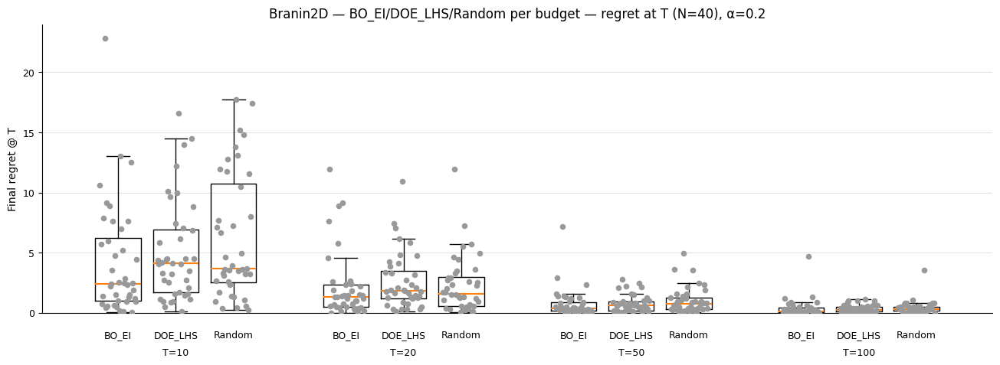

**Per-budget × method summary (final @ T, shown only):**

,budget,method,n,median,q25,q75,mean,std,min,max
0,10,BO_EI,40,2.405,1.009,6.214,4.219,4.665,0.026,22.841
1,10,DOE_LHS,40,4.103,1.672,6.922,4.997,4.143,0.108,16.558
2,10,Random,40,3.656,2.524,10.749,6.175,5.203,0.215,17.724
3,20,BO_EI,40,1.306,0.497,2.332,2.157,2.751,0.011,11.927
4,20,DOE_LHS,40,1.801,1.223,3.466,2.594,2.340,0.094,10.937
5,20,Random,40,1.598,0.550,3.000,2.319,2.360,0.043,11.938
6,50,BO_EI,40,0.352,0.171,0.867,0.750,1.230,0.000,7.191
7,50,DOE_LHS,40,0.625,0.205,0.942,0.786,0.714,0.016,2.783
8,50,Random,40,0.722,0.320,1.275,1.036,1.091,0.018,4.965
9,100,BO_EI,40,0.129,0.027,0.429,0.383,0.775,0.000,4.677


In [44]:
from pathlib import Path
_ = plot_box_methods_by_budget_inline(
        outdir=Path(r"C:\Users\marti\OneDrive\Documents\Bildung\Studium\Data_Science\IU-Data_Science\Abschlussarbeit\Code_Pipeline\Final-Sub-Benchmarks\results\20251101_231453_SB6_Budget_sensitivity"),
        problem="Branin2D",
    methods=("BO_EI","DOE_LHS","Random"),
    budgets=(10,20,50,100),
    noise_filter=0.20,
    # Layout-Tuning:
    box_width=0.3,        # breitere Boxen
    method_sep=0.38,       # mehr Abstand zwischen BO/DOE/Random
    cluster_sep=1.50,      # mehr Abstand zwischen den Budget-Gruppen
    # median_text_color="#ff7f0e",  # orange Median-Zahl
)

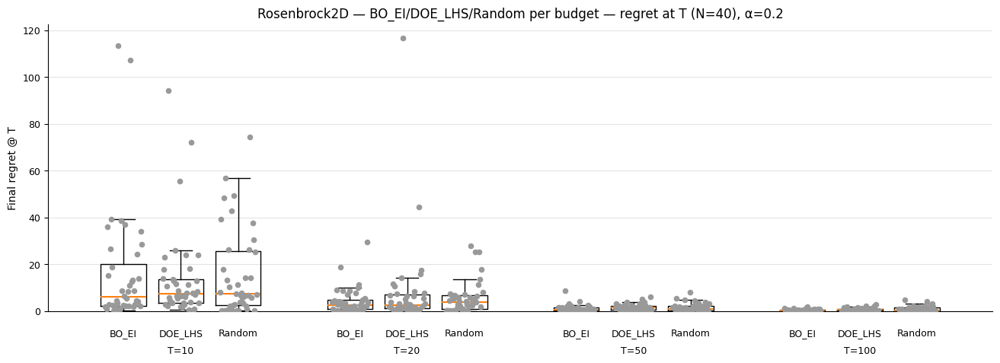

**Per-budget × method summary (final @ T, shown only):**

,budget,method,n,median,q25,q75,mean,std,min,max
0,10,BO_EI,40,5.951,2.267,20.176,16.268,25.045,0.238,113.537
1,10,DOE_LHS,40,7.430,3.621,13.541,13.712,19.191,0.412,94.385
2,10,Random,40,7.269,2.458,25.496,15.512,18.462,0.154,74.505
3,20,BO_EI,40,2.491,0.987,4.879,4.400,5.608,0.090,29.367
4,20,DOE_LHS,40,2.663,1.208,6.940,8.076,19.274,0.065,116.802
5,20,Random,40,3.912,0.924,6.735,5.713,7.037,0.018,27.753
6,50,BO_EI,40,0.557,0.318,1.447,1.141,1.528,0.043,8.732
7,50,DOE_LHS,40,1.396,0.665,2.287,1.654,1.372,0.051,6.138
8,50,Random,40,1.012,0.217,2.155,1.567,1.778,0.018,8.169
9,100,BO_EI,40,0.217,0.099,0.514,0.397,0.423,0.001,1.741


In [45]:
from pathlib import Path
_ = plot_box_methods_by_budget_inline(
        outdir=Path(r"C:\Users\marti\OneDrive\Documents\Bildung\Studium\Data_Science\IU-Data_Science\Abschlussarbeit\Code_Pipeline\Final-Sub-Benchmarks\results\20251101_231453_SB6_Budget_sensitivity"),
        problem="Rosenbrock2D",
    methods=("BO_EI","DOE_LHS","Random"),
    budgets=(10,20,50,100),
    noise_filter=0.20,
    # Layout-Tuning:
    box_width=0.3,        # breitere Boxen
    method_sep=0.38,       # mehr Abstand zwischen BO/DOE/Random
    cluster_sep=1.50,      # mehr Abstand zwischen den Budget-Gruppen
    # median_text_color="#ff7f0e",  # orange Median-Zahl
)

C:\Users\marti\AppData\Local\Temp\ipykernel_17364\1304496215.py:84: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_sb6.groupby(["problem","method","seed","budget"], as_index=False)
C:\Users\marti\AppData\Local\Temp\ipykernel_17364\1304496215.py:90: FutureWarning: The provided callable <function median at 0x00000267C83AD9D0> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  per_seed_auc_df.groupby(["problem","method","T"], as_index=False)
C:\Users\marti\AppData\Local\Temp\ipykernel_17364\1304496215.py:99: FutureWarning: The provided callable <function median at 0x00000267C83

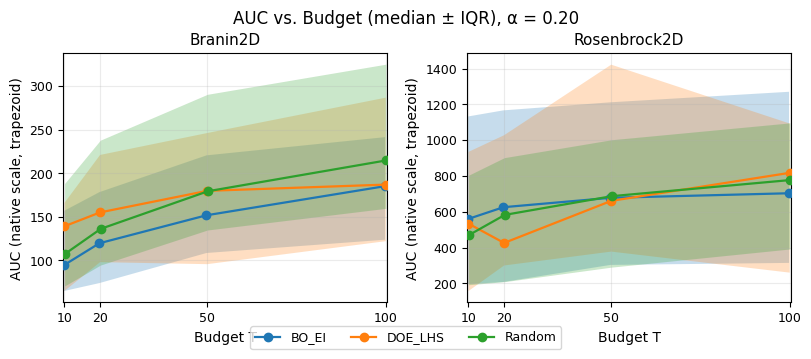

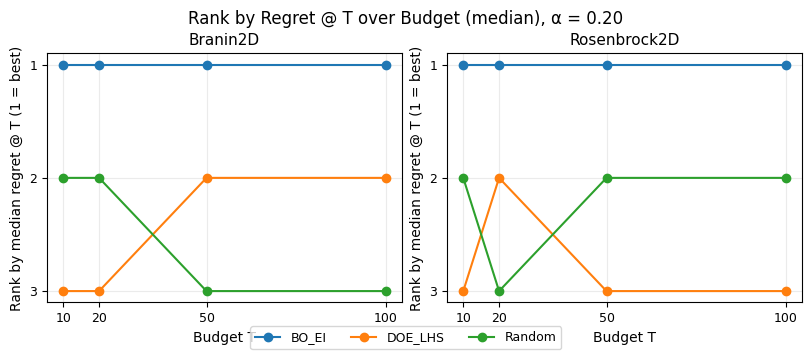

In [40]:
# ============================================
# SB6 Budget Sensitivity: AUC vs T (median ± IQR)
# and Rank Bump Chart for regret @ T
# Requirements: pandas, numpy, matplotlib (no seaborn)
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# ---------- Config ----------
CSV_PATH = None  # e.g. r"/path/to/all_runs.csv" or keep None if df provided
PROBLEMS = ["Branin2D", "Rosenbrock2D"]     # order in the figure
FOCUS_NOISE = 0.20                          # SB6 default
BUDGET_ORDER = [10, 20, 50, 100]            # shown on x-axis
# Display order per legend; will be auto-detected if not all present
METHOD_ORDER = ["BO_EI", "DOE_LHS", "Random"]

# ---------- Optional: use thesis font sizes ----------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 10,
    "axes.titlesize": 11,
    "legend.fontsize": 9,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
})

# ---------- Load ----------
if CSV_PATH is not None:
    df = pd.read_csv(CSV_PATH)
else:
    assert 'df' in globals(), "Provide CSV_PATH or a DataFrame named df in the globals()"

# ---------- Filter to SB6 slice (true regret, α=0.20) ----------
df_sb6 = df.copy()
if "noise_pct" in df_sb6.columns:
    df_sb6 = df_sb6[df_sb6["noise_pct"] == FOCUS_NOISE].copy()

# Basic guards
required_cols = {"problem","method","seed","budget","iter","regret"}
missing = required_cols - set(df_sb6.columns)
if missing:
    raise ValueError(f"Missing required columns: {missing}")

# Keep only the budgets of interest (if present)
if "budget" in df_sb6.columns and len(BUDGET_ORDER) > 0:
    df_sb6 = df_sb6[df_sb6["budget"].isin(BUDGET_ORDER)].copy()

# ---------- Helpers ----------
def trapezoid_auc(regret_series: pd.Series) -> float:
    """Discrete trapezoid with unit step over regret(t), no division by T."""
    r = regret_series.to_numpy()
    if r.size < 2:
        return 0.0
    return float(np.sum((r[:-1] + r[1:]) * 0.5))

def per_seed_auc(group: pd.DataFrame) -> pd.Series:
    g = group.sort_values("iter")
    auc_val = trapezoid_auc(g["regret"])
    T = int(g["budget"].iloc[0])
    return pd.Series({"AUC": auc_val, "T": T})

def finals_at_T(df_in: pd.DataFrame) -> pd.DataFrame:
    """Last row per (problem, method, seed, budget)."""
    idx = df_in.groupby(["problem", "method", "seed", "budget"])["iter"].idxmax()
    return df_in.loc[idx].copy()

def agg_q1_med_q3(series: pd.Series):
    return pd.Series({
        "q1": float(np.percentile(series, 25)),
        "median": float(np.median(series)),
        "q3": float(np.percentile(series, 75)),
    })

def _detect_method_order(df_in, default_order):
    present = df_in["method"].unique().tolist()
    # respect default order first, append any extras at the end
    ordered = [m for m in default_order if m in present] + [m for m in present if m not in default_order]
    return ordered

# ---------- AUC summary (median ± IQR) ----------
per_seed_auc_df = (
    df_sb6.groupby(["problem","method","seed","budget"], as_index=False)
          .apply(per_seed_auc)
          .reset_index(drop=True)
)

auc_summary = (
    per_seed_auc_df.groupby(["problem","method","T"], as_index=False)
                   .agg(AUC_q1=("AUC", lambda x: np.percentile(x,25)),
                        AUC_median=("AUC", np.median),
                        AUC_q3=("AUC", lambda x: np.percentile(x,75)))
)

# ---------- Endpoint (regret @ T) summary for rank bump ----------
finals = finals_at_T(df_sb6)
ep_summary = (
    finals.groupby(["problem","method","budget"], as_index=False)
          .agg(regret_median=("regret", np.median))
          .rename(columns={"budget":"T"})
)

# ---------- Plot 1: AUC vs budget (median ± IQR), two panels ----------
def plot_auc_vs_budget(auc_df, problems, method_order=None, budget_order=None):
    if method_order is None:
        method_order = _detect_method_order(auc_df, METHOD_ORDER)
    if budget_order is None:
        budget_order = sorted(auc_df["T"].unique().tolist())

    # diskreter x-Versatz je Methode (symmetrisch um 0)
    m = len(method_order)
    if m > 1:
        # z.B. bei 3 Methoden: [-0.2, 0.0, +0.2]
        offsets = np.linspace(-0.2, 0.2, m)
    else:
        offsets = np.array([0.0])
    offset_map = {meth: off for meth, off in zip(method_order, offsets)}

    fig, axes = plt.subplots(1, 2, figsize=(8.0, 3.2), constrained_layout=True)

    for ax, p in zip(axes, problems):
        sub = auc_df[auc_df["problem"] == p]
        ax.set_title(p)

        for meth in method_order:
            sm = sub[sub["method"] == meth].copy()
            sm = sm[sm["T"].isin(budget_order)].sort_values("T")
            if sm.empty:
                continue

            x = sm["T"].to_numpy().astype(float)
            y = sm["AUC_median"].to_numpy()
            q1 = sm["AUC_q1"].to_numpy()
            q3 = sm["AUC_q3"].to_numpy()
            x_off = x + offset_map[meth]

            # --- IQR-Ribbon ---
            ax.fill_between(
                x_off, q1, q3,
                alpha=0.25, linewidth=0, zorder=1
            )
            # (Optional) dünne Konturen auf q1/q3:
            # ax.plot(x_off, q1, linewidth=0.7, alpha=0.6, zorder=2)
            # ax.plot(x_off, q3, linewidth=0.7, alpha=0.6, zorder=2)

            # --- Median-Linie oben drauf ---
            ax.plot(
                x_off, y, marker='o', linewidth=1.6, label=meth, zorder=3
            )

        ax.set_xlabel("Budget T")
        ax.set_ylabel("AUC (native scale, trapezoid)")
        ax.grid(True, alpha=0.25)
        ax.set_xticks(budget_order)
        ax.set_xticklabels([str(t) for t in budget_order])

        # etwas x-Rand, damit versetzte Punkte nicht abgeschnitten werden
        xmin, xmax = min(budget_order), max(budget_order)
        ax.set_xlim(xmin - 0.35, xmax + 0.35)

    # eine gemeinsame Legende unten
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, ncol=len(labels), loc="lower center", bbox_to_anchor=(0.5, -0.02))
    fig.suptitle("AUC vs. Budget (median ± IQR), α = {:.2f}".format(FOCUS_NOISE), y=1.06)
    return fig, axes

# ---------- Plot 2: Rank bump (regret @ T) over budget, two panels ----------
def plot_rank_bump(ep_df, problems, method_order=None, budget_order=None):
    if method_order is None:
        method_order = _detect_method_order(ep_df, METHOD_ORDER)
    if budget_order is None:
        budget_order = sorted(ep_df["T"].unique().tolist())

    # Compute rank per (problem, T) (1 = best, lowest median regret)
    ranks = []
    for p in problems:
        sub = ep_df[(ep_df["problem"] == p) & (ep_df["T"].isin(budget_order))].copy()
        for T in budget_order:
            sliceT = sub[sub["T"] == T].copy()
            if sliceT.empty:
                continue
            # rank ascending by regret_median
            sliceT["rank"] = sliceT["regret_median"].rank(method="min", ascending=True)
            ranks.append(sliceT)
    ranks = pd.concat(ranks, ignore_index=True) if len(ranks) else ep_df.assign(rank=np.nan)

    fig, axes = plt.subplots(1, 2, figsize=(8.0, 3.2), constrained_layout=True)
    for ax, p in zip(axes, problems):
        sp = ranks[ranks["problem"] == p]
        ax.set_title(p)
        for m in method_order:
            sm = sp[sp["method"] == m].copy()
            sm = sm[sm["T"].isin(budget_order)].sort_values("T")
            if sm.empty:
                continue
            ax.plot(sm["T"].to_numpy(), sm["rank"].to_numpy(), marker='o', linewidth=1.5, label=m)
        ax.set_xlabel("Budget T")
        ax.set_ylabel("Rank by median regret @ T (1 = best)")
        ax.invert_yaxis()  # rank 1 on top
        ax.set_yticks(sorted(sp["rank"].dropna().unique()))
        ax.set_xticks(budget_order)
        ax.grid(True, alpha=0.25)

    # One shared legend
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, ncol=len(labels), loc="lower center", bbox_to_anchor=(0.5, -0.02))
    fig.suptitle("Rank by Regret @ T over Budget (median), α = {:.2f}".format(FOCUS_NOISE), y=1.06)
    return fig, axes

# ---------- Build the exact inputs for the plots ----------
auc_df = auc_summary.copy()
# Sort rows to make sure plotting respects our chosen order
auc_df["T"] = auc_df["T"].astype(int)
auc_df = auc_df[auc_df["problem"].isin(PROBLEMS)]
auc_df = auc_df.sort_values(["problem","method","T"])

ep_df = ep_summary.copy()
ep_df["T"] = ep_df["T"].astype(int)
ep_df = ep_df[ep_df["problem"].isin(PROBLEMS)]
ep_df = ep_df.sort_values(["problem","method","T"])

# ---------- Create figures ----------
fig1, axes1 = plot_auc_vs_budget(auc_df, PROBLEMS, method_order=METHOD_ORDER, budget_order=BUDGET_ORDER)
fig2, axes2 = plot_rank_bump(ep_df, PROBLEMS, method_order=METHOD_ORDER, budget_order=BUDGET_ORDER)

# If you want to save:
# fig1.savefig("SB6_AUC_vs_budget.png", dpi=300, bbox_inches="tight")
# fig2.savefig("SB6_rank_bump_regret_at_T.png", dpi=300, bbox_inches="tight")
# ============================================


**2D|3D final samples (pro Problem × Methode × T, seed=median)**  
Problems: Branin2D, Rosenbrock2D  
Methods: BO_EI, DOE_LHS, Random  
T: 10, 20, 50, 100  
α = 0.2  
Metric = regret


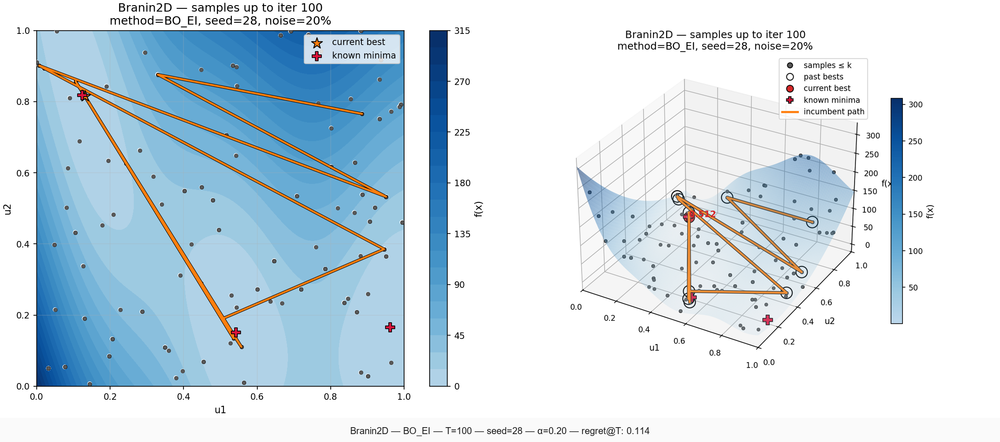
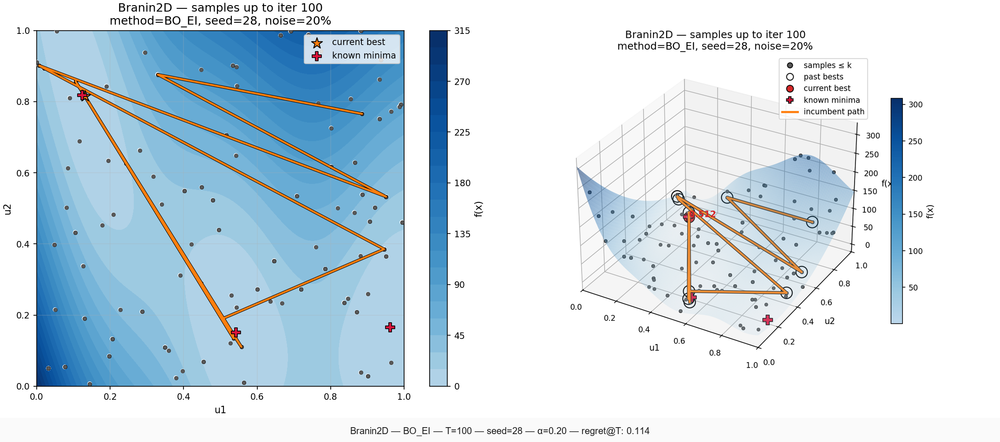
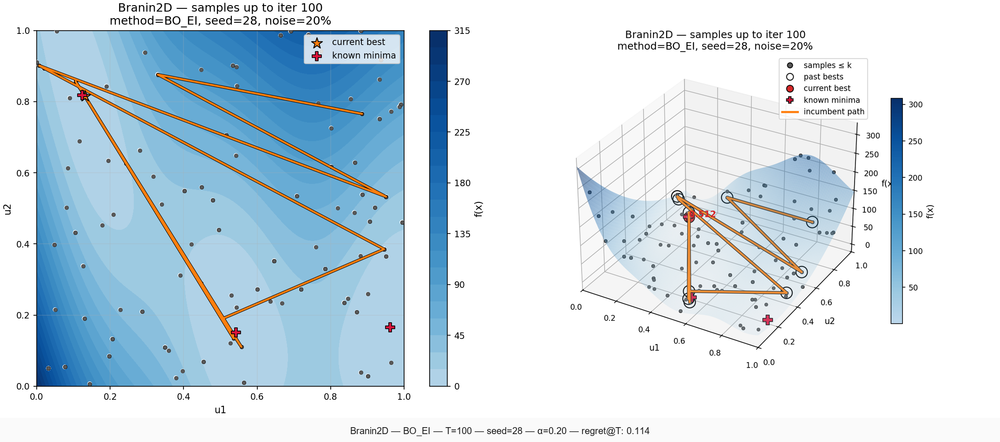
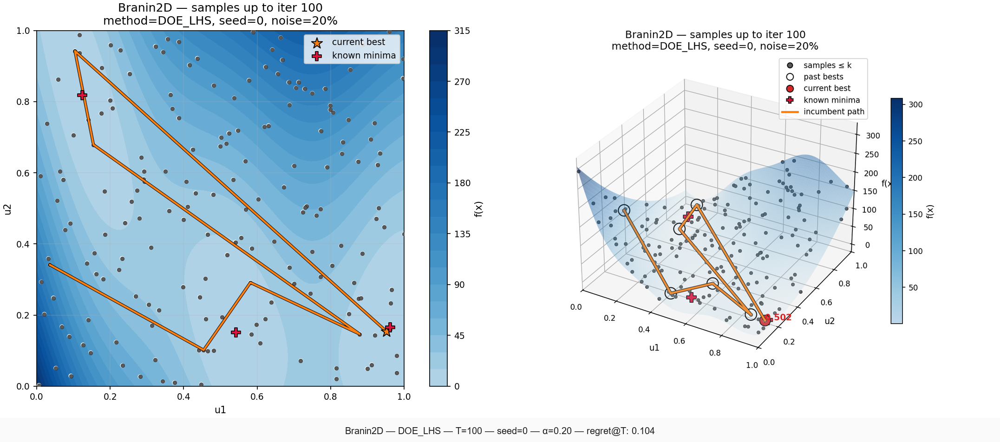
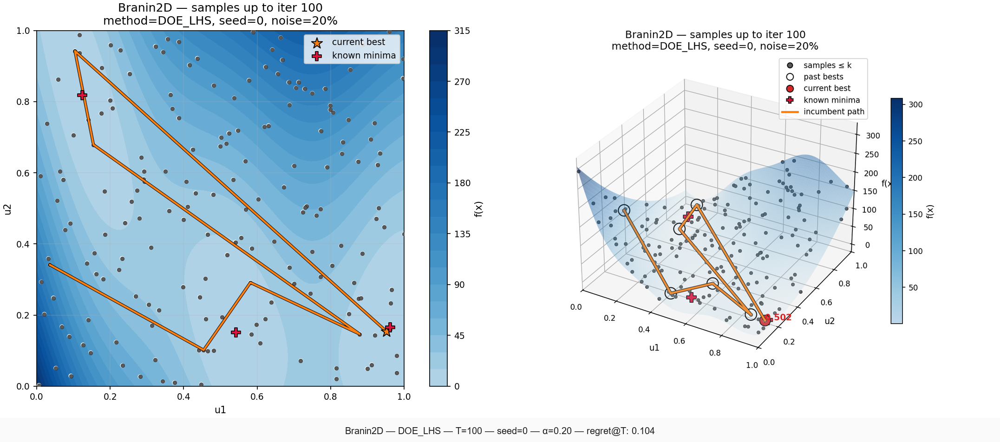
...
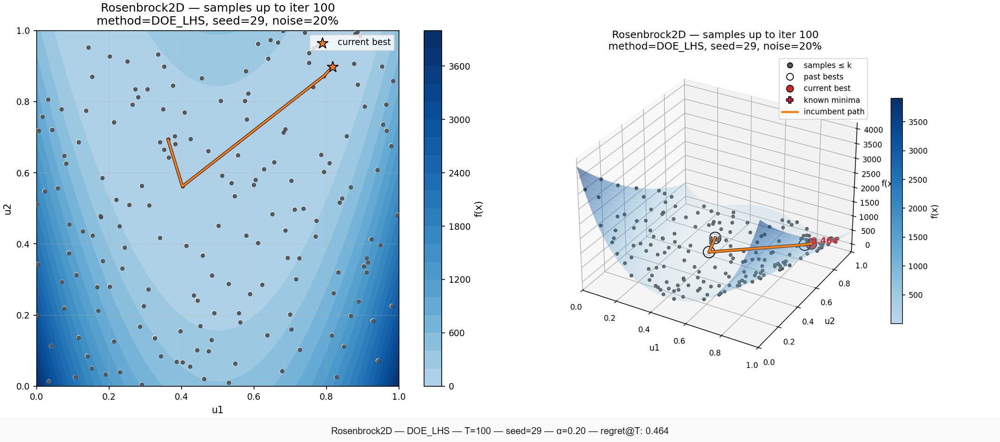
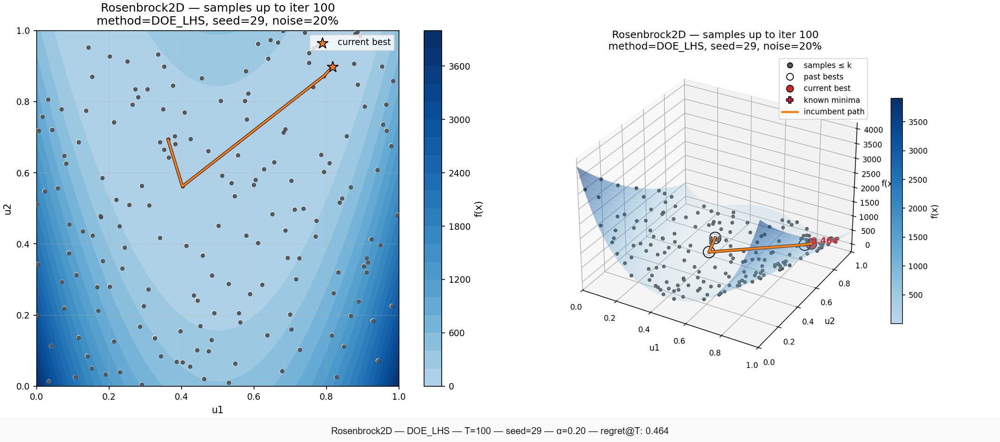
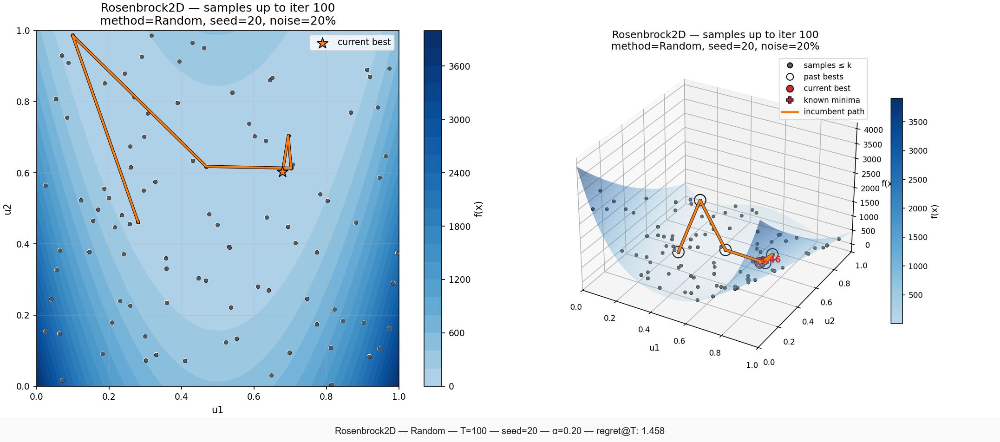
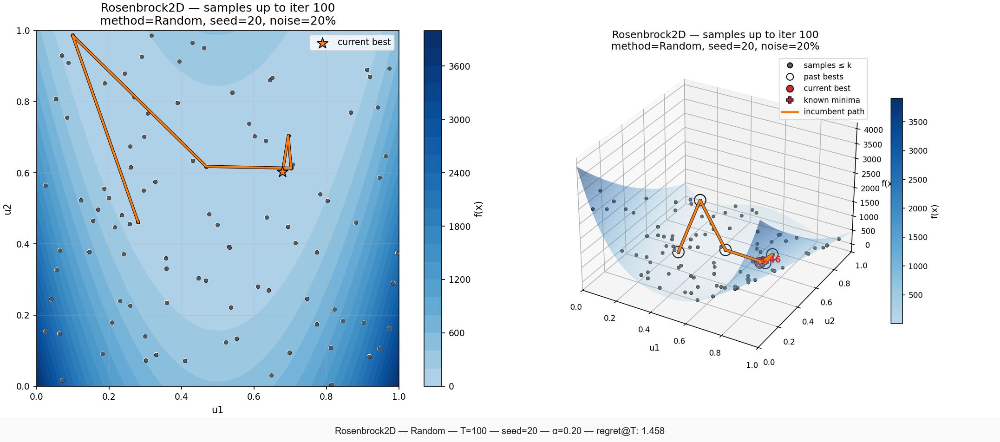
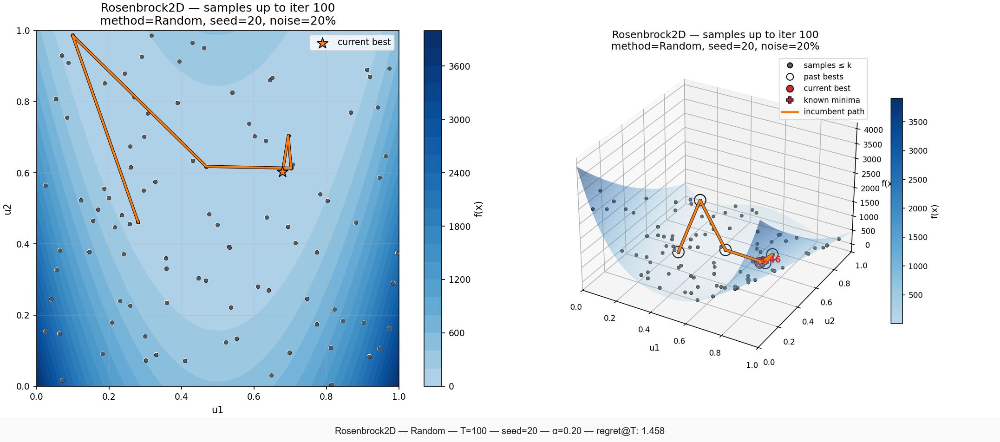

In [50]:
# === SB6: Erzeuge fehlende samples/ und zeige pro (Problem × Methode × T) eine 2D|3D-Kombi (Median-Seed) ===
from pathlib import Path
from IPython.display import HTML, display, Markdown
from contextlib import contextmanager
from PIL import Image, ImageDraw, ImageFont
import base64, mimetypes, re
import numpy as np, pandas as pd
import matplotlib.figure as mfigure
import importlib

# ----------------- PARAMS -----------------
OUTDIR   = Path(r"C:\Users\marti\OneDrive\Documents\Bildung\Studium\Data_Science\IU-Data_Science\Abschlussarbeit\Code_Pipeline\Final-Sub-Benchmarks\results\20251101_231453_SB6_Budget_sensitivity")
PROBLEMS = ["Branin2D", "Rosenbrock2D"]
METHODS  = ["BO_EI", "DOE_LHS", "Random"]
BUDGETS  = [10, 20, 50, 100]
ALPHA    = 0.20
METRIC   = "regret"   # "regret", "regret_obs", "regret_norm"
PICK     = "median"   # "median" | "best" | "worst"

# Speichern der Kombi-PNGs auf Platte (zusätzlich zur Anzeige mit Buttons)
SAVE_COMBOS = True     # bei Bedarf auf False setzen

# Anzeige (Kombi-Card)
CARDS_W = 1200; COMBO_H = 900; GAP = 18; FOOT_H = 52
BG=(255,255,255); FOOT_BG=(250,250,250); TEXT=(30,30,30)

# ----------------- Utils ------------------
def _text_wh(draw, text: str, font):
    if hasattr(draw, "textbbox"):
        l,t,r,b = draw.textbbox((0,0), text, font=font); return r-l, b-t
    try:
        l,t,r,b = font.getbbox(text); return r-l, b-t
    except Exception:
        pass
    try:
        return font.getsize(text)
    except Exception:
        return (len(text)*8, 16)

@contextmanager
def _enable_real_saving_no_tight():
    """Temporär echtes Speichern erzwingen (ohne bbox='tight'), selbst wenn Notebook show-only patch aktiv ist."""
    backup = mfigure.Figure.savefig
    def _save(self, fname, *args, **kwargs):
        kwargs.pop("bbox_inches", None)
        from matplotlib.backends.backend_agg import FigureCanvasAgg
        if not hasattr(self, "canvas") or self.canvas is None or self.canvas.__class__.__name__ != "FigureCanvasAgg":
            self.set_canvas(FigureCanvasAgg(self))
        self.canvas.print_figure(fname, **kwargs)
    mfigure.Figure.savefig = _save
    try:
        yield
    finally:
        mfigure.Figure.savefig = backup

def _value_at_T_for(df: pd.DataFrame, problem: str, method: str, seed: int, alpha: float, metric: str):
    sub = df[
        (df["problem"]==problem)&
        (df["method"]==method)&
        (df["seed"]==int(seed))&
        (df["noise_pct"].round(5)==round(float(alpha),5))
    ].sort_values("iter")
    if sub.empty: return None, None
    it_min, it_max = int(sub["iter"].min()), int(sub["iter"].max())
    T_end = it_max + (1 if it_min==0 else 0)
    col = {"regret":"regret","regret_obs":"regret_obs","regret_norm":"regret_norm"}[metric]
    val = float(sub[col].iloc[-1]) if col in sub.columns and sub[col].notna().any() else None
    return val, T_end

def _pick_seed(final_df: pd.DataFrame, metric_col: str, how: str):
    """Gibt seed für best/median/worst zurück."""
    if final_df.empty: return None
    vals = final_df[metric_col].to_numpy(float)
    if how == "best":
        idx = int(np.nanargmin(vals))
    elif how == "worst":
        idx = int(np.nanargmax(vals))
    else:  # median
        med = np.nanmedian(vals)
        idx = int(np.nanargmin(np.abs(vals - med)))
    return int(final_df.iloc[idx]["seed"])

# ----------------- Daten laden -----------------
from evaluator import load_logs, _final_rows_per_run
df_all = load_logs(OUTDIR).sort_values("iter")
try:
    base = _final_rows_per_run(df_all)
except Exception:
    keys = ["problem","method","seed","budget","noise_pct"] if "noise_pct" in df_all.columns else ["problem","method","seed","budget"]
    base = df_all.sort_values("iter").groupby(keys, as_index=False).tail(1)

# Filter auf α und gewünschte Sets
base = base[(base["problem"].isin(PROBLEMS))&(base["method"].isin(METHODS))]
if "noise_pct" in base.columns:
    base = base[np.isclose(base["noise_pct"].astype(float), float(ALPHA))]
metric_col = {"regret":"regret","regret_obs":"regret_obs","regret_norm":"regret_norm"}[METRIC]
assert metric_col in base.columns, f"Spalte {metric_col} fehlt."

# ----------------- ggf. Samples erzeugen -----------------
import viz_samples as VS
import importlib as _importlib_
_importlib_.reload(VS)

with _enable_real_saving_no_tight():
    for prob in PROBLEMS:
        for meth in METHODS:
            for T in BUDGETS:
                cand = base[
                    (base["problem"]==prob)&
                    (base["method"]==meth)&
                    (base["budget"].astype(int)==int(T))
                ].copy()
                if cand.empty:
                    continue
                seed = _pick_seed(cand, metric_col, PICK)
                if seed is None:
                    continue
                # Nur @T final erzeugen: k >= (T+1)
                k = int(T) + 1
                VS.plot_samples_every_k(df_all, prob, meth, seed, k=k, outdir=OUTDIR, noise_pct=ALPHA)

# ----------------- Kombinieren & Auswahl je (Problem, Methode, T) -----------------
SAMPLES_ROOT = OUTDIR / "samples"
pairs = []  # (p2d, p3d, problem, method, seed, T, val)
rx2d = re.compile(r"^samples2d_it(\d+)_Tfinal\.png$")

for run_dir in sorted(SAMPLES_ROOT.rglob("*")):
    if not run_dir.is_dir():
        continue
    files = {p.name: p for p in run_dir.glob("*.png")}
    # Problem & Run-Info aus Pfad
    try:
        problem = run_dir.parent.name
        m = re.match(r"(?P<meth>.+)_seed(?P<seed>\d+)(?:_noise(?P<noise>\d+)pct)?$", run_dir.name)
        if not m:
            continue
        method = m.group("meth"); seed = int(m.group("seed"))
        alpha  = 0.0 if m.group("noise") is None else int(m.group("noise"))/100.0
    except Exception:
        continue

    if problem not in PROBLEMS or method not in METHODS or not np.isclose(alpha, ALPHA):
        continue

    # passendes Tfinal suchen
    for name, p2d in files.items():
        m2 = rx2d.match(name)
        if not m2:
            continue
        it = int(m2.group(1))
        p3d = files.get(f"samples3d_it{it}_Tfinal.png")
        if p3d is None:
            continue
        val, T_end = _value_at_T_for(df_all, problem, method, seed, ALPHA, METRIC)
        if T_end in BUDGETS and it == T_end:
            pairs.append((p2d, p3d, problem, method, seed, T_end, val))

# Für jede (problem, method, T) nur EIN Bild: Seed laut PICK-Regel
df_pairs = pd.DataFrame(pairs, columns=["p2d","p3d","problem","method","seed","T","val"])
keep = []
for (prob, meth, T), sub in df_pairs.groupby(["problem","method","T"]):
    if sub.empty:
        continue
    if PICK == "best":
        idx = int(np.nanargmin(sub["val"].to_numpy(float)))
    elif PICK == "worst":
        idx = int(np.nanargmax(sub["val"].to_numpy(float)))
    else:
        v = sub["val"].to_numpy(float); med = np.nanmedian(v)
        idx = int(np.nanargmin(np.abs(v - med)))
    keep.append(sub.iloc[idx])
if not keep:
    raise RuntimeError("Keine finalen 2D|3D-Paare gefunden. Prüfe OUTDIR/alpha/Budgets.")

keep_df = pd.DataFrame(keep).reset_index(drop=True)

# ----------------- Kombi-Bilder bauen -----------------
pairs_dir = OUTDIR / "samples_pairs"
made = []

for _, r in keep_df.iterrows():
    p2d, p3d = Path(r["p2d"]), Path(r["p3d"])
    prob, meth, seed, T, val = r["problem"], r["method"], int(r["seed"]), int(r["T"]), r["val"]

    # Bilder laden & auf gleiche Höhe
    L = Image.open(p2d).convert("RGB"); R = Image.open(p3d).convert("RGB")
    def _resize_h(im, h):
        w,h0 = im.size
        if h0 != h:
            im = im.resize((int(round(w*h/h0)), h), Image.LANCZOS)
        return im
    L = _resize_h(L, COMBO_H); R = _resize_h(R, COMBO_H)
    W = L.width + GAP + R.width; H = COMBO_H + FOOT_H
    canvas = Image.new("RGB", (W, H), BG)
    canvas.paste(L, (0,0)); canvas.paste(R, (L.width+GAP, 0))

    # Footer
    draw = ImageDraw.Draw(canvas)
    try:
        font = ImageFont.truetype("arial.ttf", 20)
    except Exception:
        try:
            font = ImageFont.truetype("DejaVuSans.ttf", 20)
        except Exception:
            font = ImageFont.load_default()
    label = {"regret":"regret","regret_obs":"observed regret","regret_norm":"normalized regret"}[METRIC]
    draw.rectangle([(0, COMBO_H), (W, H)], fill=FOOT_BG)
    cap = f"{prob} — {meth} — T={T} — seed={seed} — α={ALPHA:.2f} — {label}@T: {val:.3f}"
    tw, th = _text_wh(draw, cap, font)
    draw.text(((W - tw)//2, COMBO_H + (FOOT_H - th)//2), cap, fill=TEXT, font=font)

    # konsistenter Dateiname
    name = f"{prob}_{meth}_T{T}_seed{seed}_alpha{int(round(100*ALPHA))}_pair.png"
    if SAVE_COMBOS:
        pairs_dir.mkdir(parents=True, exist_ok=True)
        outp = pairs_dir / name
        canvas.save(outp, "PNG", optimize=True)
        made.append(outp)                     # -> Path-Objekt
    else:
        made.append((canvas, name))           # -> (PIL.Image, Dateiname) für Viewer

# ----------------- Anzeigen (mit Download- und Copy-Buttons) -----------------
_style = f"""
<style>
.sb6-card {{
  width:{CARDS_W}px; margin:0 0 18px 0; padding:8px; border:1px solid #ddd; border-radius:8px; background:#fff;
}}
.sb6-toolbar {{
  display:flex; gap:12px; align-items:center; padding:6px 2px 2px 2px; font-family:ui-sans-serif,system-ui,Segoe UI,Roboto,Arial;
}}
.sb6-toolbar a, .sb6-toolbar button {{
  font-size:14px; padding:6px 10px; border:1px solid #ccc; border-radius:6px; background:#f8f8f8; cursor:pointer; text-decoration:none; color:#222;
}}
.sb6-toolbar a:hover, .sb6-toolbar button:hover {{ background:#f0f0f0; }}
</style>
"""

_script = """
<script>
async function copyImgById(id){
  try{
    const img = document.getElementById(id);
    if(!img) throw new Error('img not found');
    const res  = await fetch(img.src);
    const blob = await res.blob();
    if (!navigator.clipboard || !navigator.clipboard.write) {
      throw new Error('Clipboard API not available');
    }
    await navigator.clipboard.write([ new ClipboardItem({ [blob.type]: blob }) ]);
    alert('Bild in die Zwischenablage kopiert.');
  } catch(e){
    console.error(e);
    alert('Kopieren wird in diesem Browser/Notebook nicht unterstützt. Bitte Rechtsklick → Bild speichern/kopieren.');
  }
}
</script>
"""

cards_html = []
for i, item in enumerate(made, 1):
    if isinstance(item, Path):
        data = item.read_bytes()
        filename = item.name
        title = item.relative_to(OUTDIR).as_posix()
        mime = mimetypes.guess_type(str(item))[0] or "image/png"
    else:
        # (PIL.Image, "fallback-name.png")
        from io import BytesIO
        im, filename = item
        buf = BytesIO(); im.save(buf, format="PNG"); data = buf.getvalue()
        title = filename
        mime = "image/png"

    b64 = base64.b64encode(data).decode("ascii")
    img_id = f"sb6_img_{i}"
    cards_html.append(f"""
    <div class="sb6-card">
      <img id="{img_id}" src="data:{mime};base64,{b64}" title="{title}" style="width:{CARDS_W}px; height:auto; display:block; border-radius:6px;">
      <div class="sb6-toolbar">
        <a href="data:{mime};base64,{b64}" download="{filename}">Download PNG</a>
        <a href="data:{mime};base64,{b64}" target="_blank">Open</a>
        <button onclick="copyImgById('{img_id}')">Copy to clipboard</button>
      </div>
    </div>
    """)

display(Markdown(f"**2D|3D final samples (pro Problem × Methode × T, seed={PICK})**  \n"
                 f"Problems: {', '.join(PROBLEMS)}  \nMethods: {', '.join(METHODS)}  \nT: {', '.join(map(str,BUDGETS))}  \nα = {ALPHA}  \nMetric = {METRIC}"))
display(HTML(_style + _script + "".join(cards_html)))
